# WTS Pipeline Integration
Exploratory notebook for working on birdnet embeddings

### Imports and Setup

In [1]:
import pandas as pd
import os
import numpy as np
from annotation_post_processing import *

In [2]:
embeddingColumns = [str(i) for i in range(420)]
columnNames = ["START", "END"] + embeddingColumns
path = './input/cosmos_embeddings/'

In [3]:
import pandas as pd
import os

def generate_embeddings_from_file(path, filename):
    with open(path + filename, 'r') as f:
        data = f.read()
    with open(path + filename, 'w') as f:
        f.write(",".join(data.split("\t")))
    file_df = pd.read_csv(path + filename, names = columnNames)
    file_df["IN FILE"] = filename[:filename.index(".birdnet")] + ".wav"
    file_df["FILE SPECIES"] = " ".join(filename.split(" ")[2:4])
    return file_df

def generate_embeddings(path):
    df = pd.DataFrame()
    for filename in os.listdir(path):
        try:
            df = pd.concat([df, generate_embeddings_from_file(path, filename)], ignore_index = True)
            print("Done with " + filename)
        except Exception as e:
            print("Something went wrong with: " + filename)
    df["PATH"] = path
    columns = df.columns.tolist()
    columns = columns[-2:] + columns[:-2]
    df = df[columns]
    df = df.sort_values(["IN FILE", "START"], ascending = True)
    df = df.reset_index(drop = True)
    return df

In [4]:
embeddings_df = generate_embeddings(path)
embeddings_df

Done with XC63636 - Southern Nightingale-Wren - Microcerculus marginatus.birdnet.embeddings.txt
Done with XC84810 - Rufous-collared Sparrow - Zonotrichia capensis subtorquata.birdnet.embeddings.txt
Done with XC64386 - Buff-throated Woodcreeper - Xiphorhynchus guttatus.birdnet.embeddings.txt
Done with XC98265 - Yellow-olive Flatbill - Tolmomyias sulphurescens confusus.birdnet.embeddings.txt
Done with XC601007 - Rufous-collared Sparrow - Zonotrichia capensis.birdnet.embeddings.txt
Done with XC484117 - Buff-throated Woodcreeper - Xiphorhynchus guttatus.birdnet.embeddings.txt
Done with XC699683 - Yellow-olive Flatbill - Tolmomyias sulphurescens.birdnet.embeddings.txt
Done with XC301004 - Rufous-collared Sparrow - Zonotrichia capensis.birdnet.embeddings.txt
Done with XC104217 - Slate-throated Whitestart - Myioborus miniatus.birdnet.embeddings.txt
Done with XC609552 - White-throated Toucan - Ramphastos tucanus.birdnet.embeddings.txt
Done with XC128171 - Rufous-collared Sparrow - Zonotrichia 

,FILE SPECIES,PATH,START,END,0,1,2,3,4,5,...,411,412,413,414,415,416,417,418,419,IN FILE
0,Southern Nightingale-Wren,./input/cosmos_embeddings/,0.0,3.0,0.516491,0.650946,0.447532,0.008416,0.976974,0.210846,...,0.764997,0.224773,0.307177,0.618153,0.572281,0.898645,0.424682,0.784120,0.582382,XC100027 - Southern Nightingale-Wren - Microce...
1,Southern Nightingale-Wren,./input/cosmos_embeddings/,3.0,6.0,0.332206,0.504845,0.053778,0.049535,0.893746,0.282089,...,0.414043,0.599959,0.683068,0.572789,0.827336,0.678146,0.956513,0.310204,0.560730,XC100027 - Southern Nightingale-Wren - Microce...
2,Southern Nightingale-Wren,./input/cosmos_embeddings/,6.0,9.0,0.508598,0.422192,0.175864,0.046417,1.243934,0.341751,...,0.344001,0.751044,0.310172,1.276110,0.756434,0.482373,0.850690,0.280638,1.044262,XC100027 - Southern Nightingale-Wren - Microce...
3,Southern Nightingale-Wren,./input/cosmos_embeddings/,9.0,12.0,0.834292,0.763748,0.289305,0.254106,0.966129,0.475406,...,0.837616,0.776913,0.834856,1.046136,1.034076,0.706145,0.880231,0.625652,0.480209,XC100027 - Southern Nightingale-Wren - Microce...
4,Southern Nightingale-Wren,./input/cosmos_embeddings/,12.0,15.0,0.775968,0.195914,0.237553,0.111716,1.452784,0.297751,...,0.739770,1.074138,0.476351,1.474918,1.059757,0.871452,1.035708,0.440124,0.510227,XC100027 - Southern Nightingale-Wren - Microce...
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
39953,Blue-grey Tanager,./input/cosmos_embeddings/,0.0,3.0,1.055252,1.559146,1.135013,1.333304,0.308816,0.951709,...,0.277709,0.623836,0.808401,0.348465,0.968598,0.382283,2.083897,0.000000,0.639748,XC9881 - Blue-grey Tanager - Thraupis episcopu...
39954,Blue-grey Tanager,./input/cosmos_embeddings/,3.0,6.0,1.132612,0.653347,1.251634,0.573085,0.714166,1.560998,...,0.457551,0.526104,0.413813,0.551209,0.755623,0.408722,0.310266,0.451188,0.295859,XC9881 - Blue-grey Tanager - Thraupis episcopu...
39955,Blue-grey Tanager,./input/cosmos_embeddings/,6.0,9.0,1.082742,0.205875,0.709146,0.203989,0.907365,0.756531,...,0.156727,0.067946,0.902726,0.399330,0.752100,0.304018,1.156913,0.044347,1.153144,XC9881 - Blue-grey Tanager - Thraupis episcopu...
39956,Blue-grey Tanager,./input/cosmos_embeddings/,9.0,12.0,1.338971,0.901556,1.706767,0.925638,0.152560,1.294218,...,0.189816,0.188148,0.987711,0.478155,0.284822,0.135123,0.540614,0.374931,0.047007,XC9881 - Blue-grey Tanager - Thraupis episcopu...


In [5]:
automated_dfs:list[pd.DataFrame] = []
automated_dfs.append(pd.read_csv("./cosmos_annotations/automated_cosmos_tweety_to_file.csv"))
automated_dfs.append(pd.read_csv("./cosmos_annotations/COSMOS_BirdNET-Lite_Labels_05Conf.csv"))
automated_dfs.append(pd.read_csv("./cosmos_annotations/COSMOS_BirdNET-Lite_Labels_100.csv"))
automated_dfs.append(pd.read_csv("./cosmos_annotations/COSMOS_BirdNET-Lite-Filename_Labels_05Conf.csv"))
automated_dfs.append(pd.read_csv("./cosmos_annotations/COSMOS_Microfaune-Filename_Labels_100.csv"))
print(automated_dfs)

[       Unnamed: 0    OFFSET  DURATION  \
0               0  1.883721  0.116279   
1               1  3.976744  0.046512   
2               2  5.976744  0.046512   
3               3  6.023256  0.046512   
4               4  6.069767  0.116279   
...           ...       ...       ...   
55642       55642  1.511628  0.325581   
55643       55643  1.860465  0.139535   
55644       55644  5.976744  0.372093   
55645       55645  6.627907  0.255814   
55646       55646  0.046512  0.255814   

                                         FOLDER  \
0      C:/Users/Siloux/Desktop/E4E/Cosmos_data/   
1      C:/Users/Siloux/Desktop/E4E/Cosmos_data/   
2      C:/Users/Siloux/Desktop/E4E/Cosmos_data/   
3      C:/Users/Siloux/Desktop/E4E/Cosmos_data/   
4      C:/Users/Siloux/Desktop/E4E/Cosmos_data/   
...                                         ...   
55642  C:/Users/Siloux/Desktop/E4E/Cosmos_data/   
55643  C:/Users/Siloux/Desktop/E4E/Cosmos_data/   
55644  C:/Users/Siloux/Desktop/E4E/Cosmos_data/

### Filtering Embeddings with HDBSCAN

In [6]:
%matplotlib inline
import hdbscan
from hdbscan import HDBSCAN
from hdbscan.prediction import approximate_predict
import pickle
import seaborn as sns
from sklearn.decomposition import PCA
import matplotlib.pyplot as plt
from mpl_toolkits import mplot3d
from sklearn.preprocessing import LabelEncoder

plt.style.use("ggplot")

In [7]:
hdbscan_results = pd.DataFrame(columns=["FILE SPECIES", "PATH"] + columnNames + ["IN FILE", "LABELS"])
i = 0
for species in embeddings_df["FILE SPECIES"].unique():
    species_result = pd.read_csv(f"./ClusteringModels/species_specific/{species}.csv").drop(["Unnamed: 0"], axis=1)
    # Method 1: Simply filters out what was labeled as noise in recording
    filter_1 = species_result[species_result["LABELS"] == -1]
    
    # Method 2: Filters out noise and creates the filter by checking the mode of embedding labels (essentially to see most frequent bird, which should be dominant bird in the recording)
    species_result = species_result[species_result["LABELS"] != -1]
    max_nums = species_result["LABELS"].mode().tolist() # picking all of the modes
    filter_2 = species_result[~species_result["LABELS"].isin(max_nums)]
    
    # filter = filter_1
    filter = pd.concat([filter_1, filter_2], axis=0)
    
    hdbscan_results = pd.concat([hdbscan_results, filter], axis=0)
    i += 1
    print(f"Done {i}")

hdbscan_results

Done 1
Done 2
Done 3
Done 4
Done 5
Done 6
Done 7
Done 8
Done 9
Done 10


,FILE SPECIES,PATH,START,END,0,1,2,3,4,5,...,412,413,414,415,416,417,418,419,IN FILE,LABELS
3,Southern Nightingale-Wren,./input/cosmos_embeddings/,9.0,12.0,0.834292,0.763748,0.289305,0.254106,0.966129,0.475406,...,0.776913,0.834856,1.046136,1.034076,0.706145,0.880231,0.625652,0.480209,XC100027 - Southern Nightingale-Wren - Microce...,-1
4,Southern Nightingale-Wren,./input/cosmos_embeddings/,12.0,15.0,0.775968,0.195914,0.237553,0.111716,1.452784,0.297751,...,1.074138,0.476351,1.474918,1.059757,0.871452,1.035708,0.440124,0.510227,XC100027 - Southern Nightingale-Wren - Microce...,-1
5,Southern Nightingale-Wren,./input/cosmos_embeddings/,15.0,18.0,1.123224,1.446565,0.158934,0.189304,0.867770,0.828269,...,0.466223,0.366277,0.988211,1.098432,0.527290,0.978498,0.431979,0.612844,XC100027 - Southern Nightingale-Wren - Microce...,-1
8,Southern Nightingale-Wren,./input/cosmos_embeddings/,24.0,27.0,0.594054,0.679862,0.017588,0.065464,0.826729,0.546373,...,0.478856,0.745007,0.987615,0.563101,0.242254,0.530192,0.329238,0.530640,XC100027 - Southern Nightingale-Wren - Microce...,-1
11,Southern Nightingale-Wren,./input/cosmos_embeddings/,33.0,36.0,0.492743,0.713020,0.756853,0.128593,1.400624,0.447811,...,0.678490,0.977921,0.813194,1.060235,0.172700,0.966179,0.430132,0.446345,XC100027 - Southern Nightingale-Wren - Microce...,-1
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1256,Scaly-breasted Woodpecker,./input/cosmos_embeddings/,24.0,27.0,0.610505,0.296693,0.483295,0.056628,0.113244,0.644921,...,0.412486,0.428114,0.249396,0.622904,1.125753,1.450461,0.069599,0.470338,XC753 - Scaly-breasted Woodpecker - Celeus gra...,8
1257,Scaly-breasted Woodpecker,./input/cosmos_embeddings/,27.0,30.0,0.958089,0.305177,0.192699,0.749554,0.307977,0.361235,...,0.524962,0.435501,0.373535,0.517083,1.236541,1.000128,0.444875,0.620538,XC753 - Scaly-breasted Woodpecker - Celeus gra...,8
1258,Scaly-breasted Woodpecker,./input/cosmos_embeddings/,30.0,33.0,0.877227,0.319196,0.393915,0.568002,0.372513,0.564511,...,0.388511,0.470560,0.735972,1.169871,0.819529,1.088604,0.176100,0.463833,XC753 - Scaly-breasted Woodpecker - Celeus gra...,8
1268,Scaly-breasted Woodpecker,./input/cosmos_embeddings/,6.0,9.0,0.424716,0.328351,0.436900,0.155210,0.263310,0.343720,...,0.280424,0.334078,0.201588,0.644591,0.568780,0.835398,0.395326,0.166977,XC87450 - Scaly-breasted Woodpecker - Celeus g...,29


In [8]:
filtered_embeddings = hdbscan_results
print("Created filter")

filtered_embeddings

Created filter


,FILE SPECIES,PATH,START,END,0,1,2,3,4,5,...,412,413,414,415,416,417,418,419,IN FILE,LABELS
3,Southern Nightingale-Wren,./input/cosmos_embeddings/,9.0,12.0,0.834292,0.763748,0.289305,0.254106,0.966129,0.475406,...,0.776913,0.834856,1.046136,1.034076,0.706145,0.880231,0.625652,0.480209,XC100027 - Southern Nightingale-Wren - Microce...,-1
4,Southern Nightingale-Wren,./input/cosmos_embeddings/,12.0,15.0,0.775968,0.195914,0.237553,0.111716,1.452784,0.297751,...,1.074138,0.476351,1.474918,1.059757,0.871452,1.035708,0.440124,0.510227,XC100027 - Southern Nightingale-Wren - Microce...,-1
5,Southern Nightingale-Wren,./input/cosmos_embeddings/,15.0,18.0,1.123224,1.446565,0.158934,0.189304,0.867770,0.828269,...,0.466223,0.366277,0.988211,1.098432,0.527290,0.978498,0.431979,0.612844,XC100027 - Southern Nightingale-Wren - Microce...,-1
8,Southern Nightingale-Wren,./input/cosmos_embeddings/,24.0,27.0,0.594054,0.679862,0.017588,0.065464,0.826729,0.546373,...,0.478856,0.745007,0.987615,0.563101,0.242254,0.530192,0.329238,0.530640,XC100027 - Southern Nightingale-Wren - Microce...,-1
11,Southern Nightingale-Wren,./input/cosmos_embeddings/,33.0,36.0,0.492743,0.713020,0.756853,0.128593,1.400624,0.447811,...,0.678490,0.977921,0.813194,1.060235,0.172700,0.966179,0.430132,0.446345,XC100027 - Southern Nightingale-Wren - Microce...,-1
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1256,Scaly-breasted Woodpecker,./input/cosmos_embeddings/,24.0,27.0,0.610505,0.296693,0.483295,0.056628,0.113244,0.644921,...,0.412486,0.428114,0.249396,0.622904,1.125753,1.450461,0.069599,0.470338,XC753 - Scaly-breasted Woodpecker - Celeus gra...,8
1257,Scaly-breasted Woodpecker,./input/cosmos_embeddings/,27.0,30.0,0.958089,0.305177,0.192699,0.749554,0.307977,0.361235,...,0.524962,0.435501,0.373535,0.517083,1.236541,1.000128,0.444875,0.620538,XC753 - Scaly-breasted Woodpecker - Celeus gra...,8
1258,Scaly-breasted Woodpecker,./input/cosmos_embeddings/,30.0,33.0,0.877227,0.319196,0.393915,0.568002,0.372513,0.564511,...,0.388511,0.470560,0.735972,1.169871,0.819529,1.088604,0.176100,0.463833,XC753 - Scaly-breasted Woodpecker - Celeus gra...,8
1268,Scaly-breasted Woodpecker,./input/cosmos_embeddings/,6.0,9.0,0.424716,0.328351,0.436900,0.155210,0.263310,0.343720,...,0.280424,0.334078,0.201588,0.644591,0.568780,0.835398,0.395326,0.166977,XC87450 - Scaly-breasted Woodpecker - Celeus g...,29


### Applying Mask to WTS Pipeline

In [9]:
count1 = 0
def split_annotations(df: pd.DataFrame):
    all_split_ann = pd.DataFrame(columns = df.columns)
    for i in range(df.shape[0]):
        x = df.iloc[i]
        startsends = np.linspace(3.0 * (int(x["OFFSET"] / 3)), 3.0 * (int((x["OFFSET"] + x["DURATION"])/ 3) + 1), int((x["OFFSET"] + x["DURATION"])/ 3) - int(x["OFFSET"] / 3) + 2)
        starts = startsends[:-1]
        starts[0] = x["OFFSET"]
        ends = startsends[1:]
        ends[-1] = x["OFFSET"] + x["DURATION"]
        split_ann = pd.DataFrame(columns = x.index)
        for i in range(len(starts)):
            new_x = pd.DataFrame(x.copy()).T
            new_x["OFFSET"] = starts[i]
            new_x["DURATION"] = ends[i] - starts[i]
            if np.isclose(new_x["DURATION"], 0):
                continue
            split_ann = pd.concat([split_ann, new_x])
        all_split_ann = pd.concat([all_split_ann, split_ann])
        global count1
        count1 += 1
        print(f"Completed {count1} annotations")
    return all_split_ann.reset_index(drop = True)

count2 = 0
def create_annotation_filter(x: pd.Series, filter: pd.DataFrame) -> pd.DataFrame:
    filter_x = filter[filter["IN FILE"].str.startswith(x["IN FILE"].split(".mp3")[0])]
    starts = filter_x["START"].to_numpy()
    ends = filter_x["END"].to_numpy()
    close_starts = np.isclose(starts, x["OFFSET"]).sum()
    close_ends = np.isclose(ends, x["OFFSET"] + x["DURATION"]).sum()
    middle1 = starts < x["OFFSET"]
    middle2 = ends > x["OFFSET"] + x["DURATION"]
    middle = (middle1*middle2).sum()
    if (close_starts + close_ends + middle) > 0:
        x["FILTERED"] = True
    else:
        x["FILTERED"] = False
    global count2
    count2 += 1
    print(f"Completed {count2} annotations")
    return x

In [10]:
automated_dfs_split = [split_annotations(df) for df in automated_dfs]
print(automated_dfs_split)

Completed 1 annotations
Completed 2 annotations
Completed 3 annotations
Completed 4 annotations
Completed 5 annotations
Completed 6 annotations
Completed 7 annotations
Completed 8 annotations
Completed 9 annotations
Completed 10 annotations
Completed 11 annotations
Completed 12 annotations
Completed 13 annotations
Completed 14 annotations
Completed 15 annotations
Completed 16 annotations
Completed 17 annotations
Completed 18 annotations
Completed 19 annotations
Completed 20 annotations
Completed 21 annotations
Completed 22 annotations
Completed 23 annotations
Completed 24 annotations
Completed 25 annotations
Completed 26 annotations
Completed 27 annotations
Completed 28 annotations
Completed 29 annotations
Completed 30 annotations
Completed 31 annotations
Completed 32 annotations
Completed 33 annotations
Completed 34 annotations
Completed 35 annotations
Completed 36 annotations
Completed 37 annotations
Completed 38 annotations
Completed 39 annotations
Completed 40 annotations
Completed

In [11]:
automated_dfs_filtered = [df.apply(lambda x: create_annotation_filter(x, filtered_embeddings), axis = 1) for df in automated_dfs_split]
automated_dfs_filtered = [df[~df["FILTERED"]] for df in automated_dfs_filtered]
print(automated_dfs_filtered)

Completed 1 annotations
Completed 2 annotations
Completed 3 annotations
Completed 4 annotations
Completed 5 annotations
Completed 6 annotations
Completed 7 annotations
Completed 8 annotations
Completed 9 annotations
Completed 10 annotations
Completed 11 annotations
Completed 12 annotations
Completed 13 annotations
Completed 14 annotations
Completed 15 annotations
Completed 16 annotations
Completed 17 annotations
Completed 18 annotations
Completed 19 annotations
Completed 20 annotations
Completed 21 annotations
Completed 22 annotations
Completed 23 annotations
Completed 24 annotations
Completed 25 annotations
Completed 26 annotations
Completed 27 annotations
Completed 28 annotations
Completed 29 annotations
Completed 30 annotations
Completed 31 annotations
Completed 32 annotations
Completed 33 annotations
Completed 34 annotations
Completed 35 annotations
Completed 36 annotations
Completed 37 annotations
Completed 38 annotations
Completed 39 annotations
Completed 40 annotations
Completed

In [12]:
print([df.shape[0] for df in automated_dfs])
print([df.shape[0] for df in automated_dfs_split])
print([df.shape[0] for df in automated_dfs_filtered])

[55647, 13678, 41349, 13678, 29533]
[77751, 13678, 41349, 13678, 29533]
[12305, 608, 2202, 608, 1746]


#### Conclusion
The above shows that the filtering worked, in that it reduced the total number of annotations. The next section will show the statistics.

### Statistics

In [13]:
from statistics import *

In [14]:
manual_df = pd.read_csv("cosmos_annotations/cosmos_labeled_data_files_added.csv")
manual_df["IN FILE"] = manual_df["IN FILE"].apply(lambda x: " ".join(x.split("_")))
manual_df["FOLDER"] = "./cosmos_annotations/"
manual_df

,Unnamed: 0,IN FILE,CLIP LENGTH,OFFSET,DURATION,MAX FREQ,MIN FREQ,SAMPLE RATE,MANUAL ID,TIME_SPENT,LAST MOD BY,CONFIDENCE,RETIRED,COUNTED,FOLDER,COMMON,SCIENTIFIC
0,0,XC87449 - Scaly-breasted Woodpecker - Celeus g...,23.2956,0.7025,0.9199,24000,0,44100,Celeus grammicus,365.822,lynette 07/27/2022-17:52:13,0,False,0,./cosmos_annotations/,Scaly-breasted Woodpecker,Celeus grammicus
1,1,XC87449 - Scaly-breasted Woodpecker - Celeus g...,23.2956,4.6223,0.9400,24000,0,44100,Celeus grammicus,365.822,lynette 07/27/2022-17:52:13,0,False,0,./cosmos_annotations/,Scaly-breasted Woodpecker,Celeus grammicus
2,2,XC87449 - Scaly-breasted Woodpecker - Celeus g...,23.2956,11.4420,0.9300,24000,0,44100,Celeus grammicus,176.450,lynette 07/27/2022-17:52:00,0,False,0,./cosmos_annotations/,Scaly-breasted Woodpecker,Celeus grammicus
3,3,XC87449 - Scaly-breasted Woodpecker - Celeus g...,23.2956,18.4117,0.8700,24000,0,44100,Celeus grammicus,365.822,lynette 07/27/2022-17:52:13,0,False,0,./cosmos_annotations/,Scaly-breasted Woodpecker,Celeus grammicus
4,4,XC87449 - Scaly-breasted Woodpecker - Celeus g...,23.2956,21.9915,0.7600,24000,0,44100,Celeus grammicus,176.450,lynette 07/27/2022-17:52:00,0,False,0,./cosmos_annotations/,Scaly-breasted Woodpecker,Celeus grammicus
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
5187,648,XC27942 - Yellow-olive Flatbill - Tolmomyias s...,31.3404,15.4774,0.4799,24000,0,44100,Tolmomyias sulphurescens,76.420,Taejun 07/27/2022-18:16:18,0,False,0,./cosmos_annotations/,Yellow-olive Flatbill,Tolmomyias sulphurescens
5188,649,XC27942 - Yellow-olive Flatbill - Tolmomyias s...,31.3404,5.4311,0.5899,24000,0,44100,Tolmomyias sulphurescens,76.420,Taejun 07/27/2022-18:16:18,0,False,0,./cosmos_annotations/,Yellow-olive Flatbill,Tolmomyias sulphurescens
5189,650,XC27942 - Yellow-olive Flatbill - Tolmomyias s...,31.3404,7.1648,0.6299,24000,0,44100,Tolmomyias sulphurescens,76.420,Taejun 07/27/2022-18:16:18,0,False,0,./cosmos_annotations/,Yellow-olive Flatbill,Tolmomyias sulphurescens
5190,651,XC27942 - Yellow-olive Flatbill - Tolmomyias s...,31.3404,10.3063,0.4499,24000,0,44100,Tolmomyias sulphurescens,76.420,Taejun 07/27/2022-18:16:18,0,False,0,./cosmos_annotations/,Yellow-olive Flatbill,Tolmomyias sulphurescens


In [15]:
import warnings
warnings.filterwarnings("ignore")
clip_stats_original = [clip_statistics(df, manual_df, "general") for df in automated_dfs]
clip_stats_filtered = [clip_statistics(df, manual_df, "general") for df in automated_dfs_filtered]

Processed 50 clips in 2.7 seconds
Error calculating statistics, likely due
        to zero division, setting values to zero
Something went wrong with 50 clips out of 94 clips
Processed 250 clips in 3.7 seconds
Something went wrong with 232 clips out of 258 clips
Error calculating statistics, likely due
        to zero division, setting values to zero
Processed 100 clips in 2.0 seconds
Error calculating statistics, likely due
        to zero division, setting values to zero
Error calculating statistics, likely due
        to zero division, setting values to zero
Something went wrong with 134 clips out of 187 clips
Something went wrong with 189 clips out of 234 clips
Processed 100 clips in 2.6 seconds
Something went wrong with 110 clips out of 149 clips
Something went wrong with 349 clips out of 401 clips
Processed 200 clips in 2.6 seconds
Processed 250 clips in 0.8 seconds
Something went wrong with 238 clips out of 272 clips
Processed 100 clips in 1.4 seconds
Processed 200 clips in 0.6 

In [16]:
class_stats_original = [class_statistics(stats) for stats in clip_stats_original]
class_stats_filtered = [class_statistics(stats) for stats in clip_stats_filtered]

In [17]:
class_stats_original[0]

,MANUAL ID,TRUE POSITIVE,FALSE NEGATIVE,FALSE POSITIVE,PRECISION,RECALL,F1
0,Celeus grammicus,113.384240,146.143923,257.177324,0.3060,0.4369,0.3599
1,Microcerculus marginatus,352.578594,240.512721,123.540748,0.7405,0.5945,0.6595
2,Myioborus miniatus,339.125125,126.491066,155.562812,0.6855,0.7283,0.7063
3,Ramphastos tucanus,874.601882,347.855624,156.701610,0.8481,0.7154,0.7761
4,Thraupis episcopus,351.393810,87.187324,348.766463,0.5019,0.8012,0.6172
5,Tolmomyias sulphurescens,221.261066,77.257619,231.771383,0.4884,0.7412,0.5888
6,Trogon viridis,431.089093,291.178118,299.116689,0.5904,0.5969,0.5936
7,Turdus leucomelas,662.576463,174.338776,227.477143,0.7444,0.7917,0.7673
8,Xiphorhynchus guttatus,590.614512,156.416304,218.267279,0.7302,0.7906,0.7592
9,Zonotrichia capensis,408.120113,136.352880,128.272789,0.7609,0.7496,0.7552


In [18]:
class_stats_filtered[0]

,MANUAL ID,TRUE POSITIVE,FALSE NEGATIVE,FALSE POSITIVE,PRECISION,RECALL,F1
0,Celeus grammicus,5.758730,115.932109,12.499297,0.3154,0.0473,0.0823
1,Microcerculus marginatus,3.866485,352.938889,5.042494,0.4340,0.0108,0.0211
2,Myioborus miniatus,17.097574,263.978776,14.357415,0.5436,0.0608,0.1094
3,Ramphastos tucanus,20.528549,559.797937,10.309184,0.6657,0.0354,0.0672
4,Thraupis episcopus,2.323197,158.647483,14.766236,0.1359,0.0144,0.0261
5,Tolmomyias sulphurescens,5.698685,137.651293,12.728118,0.3093,0.0398,0.0705
6,Trogon viridis,3.993696,324.557120,12.420295,0.2433,0.0122,0.0232
7,Turdus leucomelas,20.046599,403.271995,13.867075,0.5911,0.0474,0.0877
8,Xiphorhynchus guttatus,28.743356,574.271179,21.254036,0.5749,0.0477,0.0880
9,Zonotrichia capensis,19.384694,332.062426,11.379501,0.6301,0.0552,0.1014


In [19]:
all_class_stats = [pd.concat([class_stats_original[i].assign(MODEL = "original"), class_stats_filtered[i].assign(MODEL = "filtered")]) for i in range(len(class_stats_original))]
all_class_stats = [df[df["MANUAL ID"] != "Lipaugus vociferans"] for df in all_class_stats]
all_class_stats[0]

,MANUAL ID,TRUE POSITIVE,FALSE NEGATIVE,FALSE POSITIVE,PRECISION,RECALL,F1,MODEL
0,Celeus grammicus,113.384240,146.143923,257.177324,0.3060,0.4369,0.3599,original
1,Microcerculus marginatus,352.578594,240.512721,123.540748,0.7405,0.5945,0.6595,original
2,Myioborus miniatus,339.125125,126.491066,155.562812,0.6855,0.7283,0.7063,original
3,Ramphastos tucanus,874.601882,347.855624,156.701610,0.8481,0.7154,0.7761,original
4,Thraupis episcopus,351.393810,87.187324,348.766463,0.5019,0.8012,0.6172,original
5,Tolmomyias sulphurescens,221.261066,77.257619,231.771383,0.4884,0.7412,0.5888,original
6,Trogon viridis,431.089093,291.178118,299.116689,0.5904,0.5969,0.5936,original
7,Turdus leucomelas,662.576463,174.338776,227.477143,0.7444,0.7917,0.7673,original
8,Xiphorhynchus guttatus,590.614512,156.416304,218.267279,0.7302,0.7906,0.7592,original
9,Zonotrichia capensis,408.120113,136.352880,128.272789,0.7609,0.7496,0.7552,original


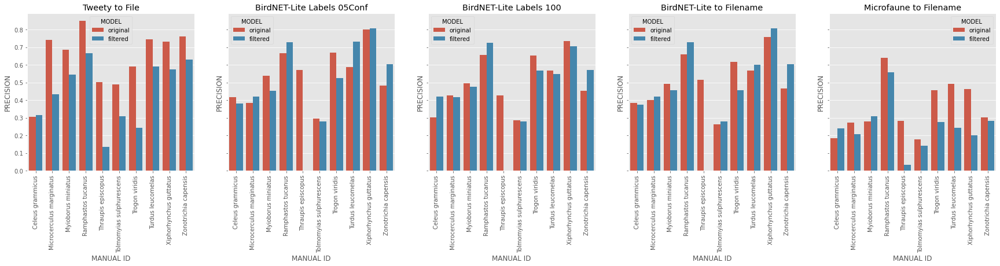

In [20]:
%matplotlib inline
import seaborn as sns
import matplotlib.pyplot as plt

# Plotting each model separately
figure, axes = plt.subplots(1, len(class_stats_original), figsize = (30, 5), sharex = False, sharey = True)

x = 0
model_list = ["Tweety to File", "BirdNET-Lite Labels 05Conf", "BirdNET-Lite Labels 100", "BirdNET-Lite to Filename", "Microfaune to Filename"]

for model in model_list:
    plot = sns.barplot(ax = axes[x], data = all_class_stats[x], x = "MANUAL ID", y = "PRECISION", hue = "MODEL")
    for label in plot.get_xticklabels():
        label.set_rotation(90)
    plot.set(title = model)
    x += 1

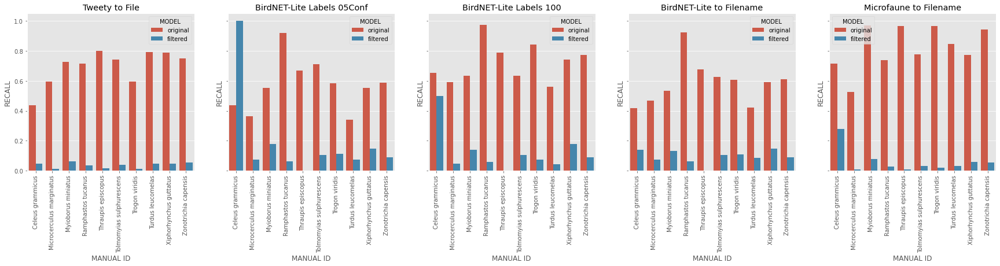

In [21]:
figure, axes = plt.subplots(1, len(class_stats_original), figsize = (30, 5), sharex = False, sharey = True)

x = 0

for model in model_list:
    plot = sns.barplot(ax = axes[x], data = all_class_stats[x], x = "MANUAL ID", y = "RECALL", hue = "MODEL")
    for label in plot.get_xticklabels():
        label.set_rotation(90)
    plot.set(title = model)
    x += 1

### Visualizations

#### Initial Embeddings

Text(0.5, 0.98, 'PCA Visualization 2D (Original Embeddings)')

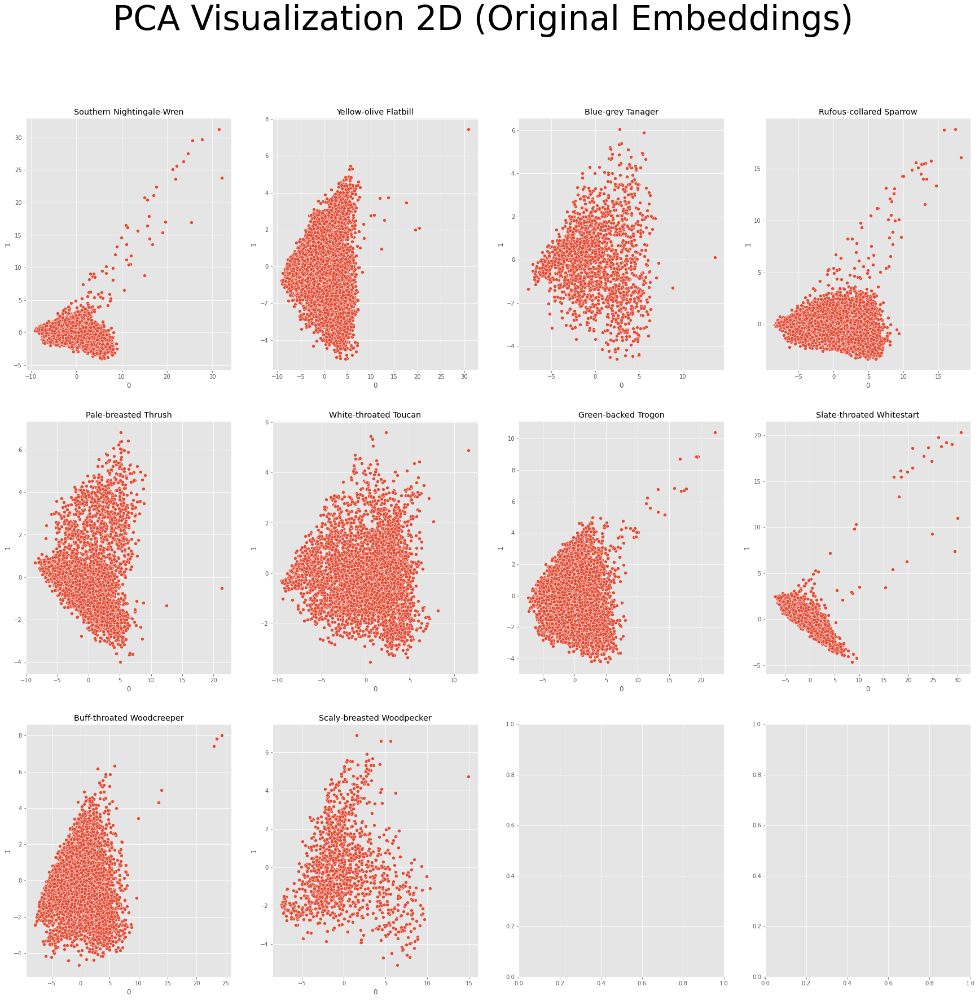

In [22]:
# 2D Visualization for initial embeddings
figure, axes = plt.subplots(3, 4, figsize = (30, 28), sharex = False)

x = 0
y = 0

pca_2d_list:list[PCA] = []

for species in embeddings_df["FILE SPECIES"].unique():
    pca_2d = PCA(n_components = 2, random_state = 42)
    pca_columns_2d = pd.DataFrame(pca_2d.fit_transform(embeddings_df[embeddings_df["FILE SPECIES"] == species][embeddingColumns].dropna())).T
    scatter_plot = sns.scatterplot(ax = axes[x, y], x = pca_columns_2d.iloc[0], y = pca_columns_2d.iloc[1])
    if y < 3:
        y += 1
    else:
        y = 0
        x += 1
    scatter_plot.set(title = species)
    pca_2d_list += [pca_2d]

figure.suptitle("PCA Visualization 2D (Original Embeddings)", size=60)

Text(0.5, 0.98, 'PCA Visualization 3D (Original Embeddings)')

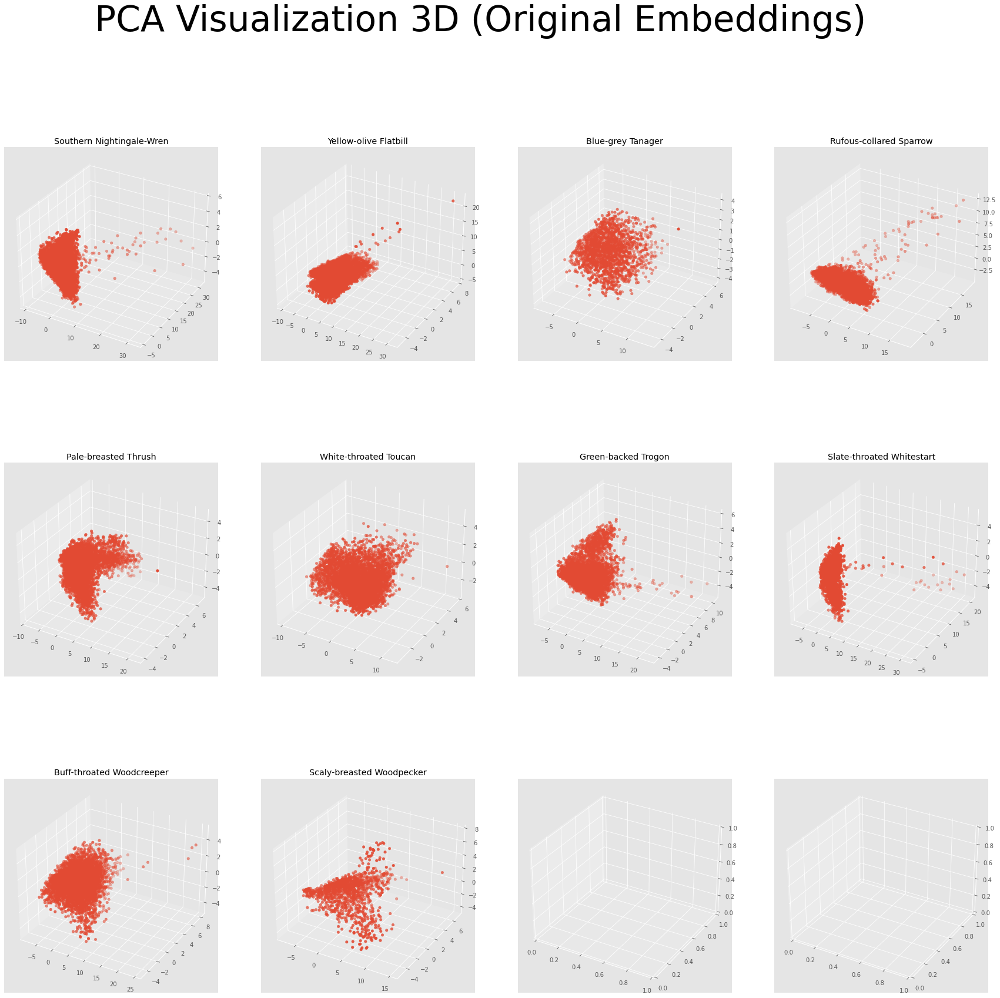

In [23]:
# 3D Visualization for initial embeddings
figure, axes = plt.subplots(3, 4, figsize = (30, 28), subplot_kw=dict(projection='3d'))

x = 0
y = 0

pca_3d_list:list[PCA] = []

for species in embeddings_df["FILE SPECIES"].unique():
    pca_3d = PCA(n_components = 3, random_state = 42)
    pca_columns_3d = pd.DataFrame(pca_3d.fit_transform(embeddings_df[embeddings_df["FILE SPECIES"] == species][embeddingColumns].dropna())).T
    scatter_plot = axes[x, y].scatter(pca_columns_3d.iloc[0], pca_columns_3d.iloc[1], pca_columns_3d.iloc[2])
    axes[x, y].title.set_text(species)
    if y < 3:
        y += 1
    else:
        y = 0
        x += 1
    pca_3d_list += [pca_3d]

figure.suptitle("PCA Visualization 3D (Original Embeddings)", size=60)

#### Filtered Out Embeddings

Text(0.5, 0.98, 'PCA Visualization 2D (Filtered Embeddings)')

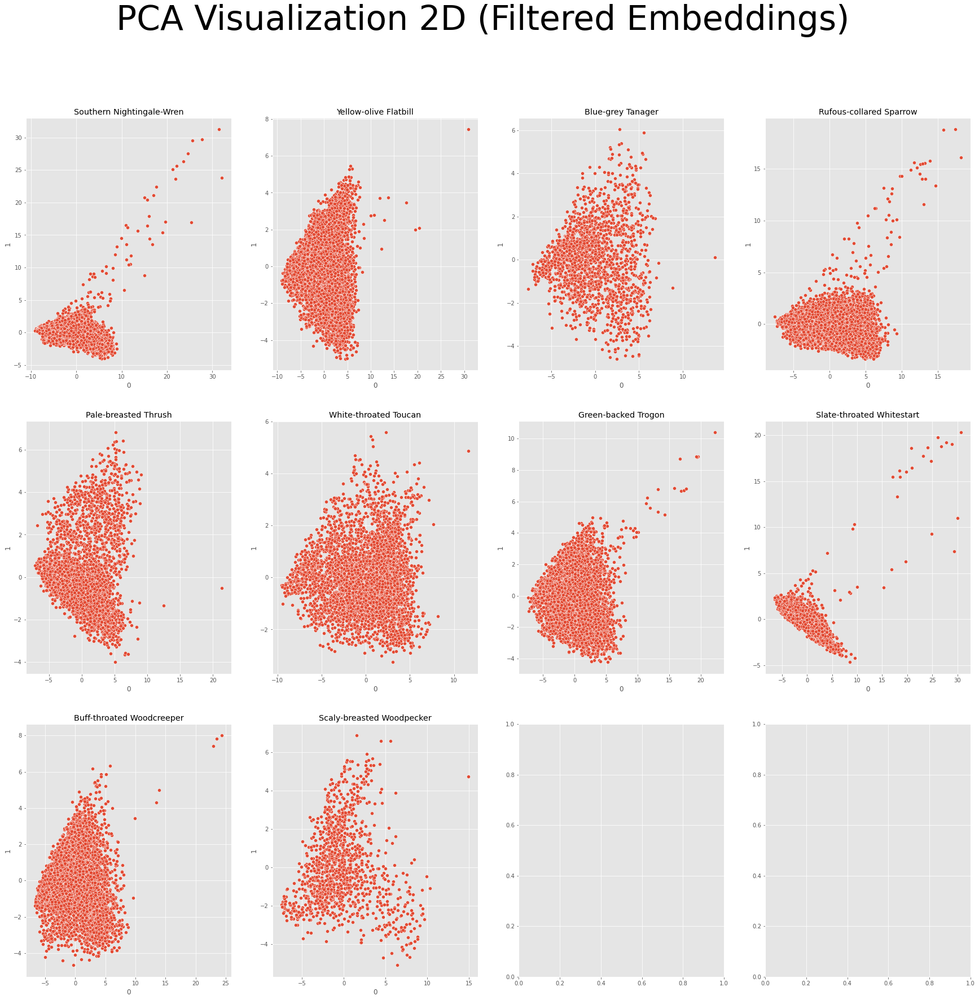

In [24]:
# 2D Visualization for filtered embeddings
figure, axes = plt.subplots(3, 4, figsize = (30, 28), sharex = False)

x = 0
y = 0

i = 0
for species in embeddings_df["FILE SPECIES"].unique():
    pca_columns_2d = pd.DataFrame(pca_2d_list[i].transform(filtered_embeddings[filtered_embeddings["FILE SPECIES"] == species][embeddingColumns].dropna())).T
    scatter_plot = sns.scatterplot(ax = axes[x, y], x = pca_columns_2d.iloc[0], y = pca_columns_2d.iloc[1])
    if y < 3:
        y += 1
    else:
        y = 0
        x += 1
    i += 1
    scatter_plot.set(title = species)

figure.suptitle("PCA Visualization 2D (Filtered Embeddings)", size=60)

Text(0.5, 0.98, 'PCA Visualization 3D (Filtered Embeddings)')

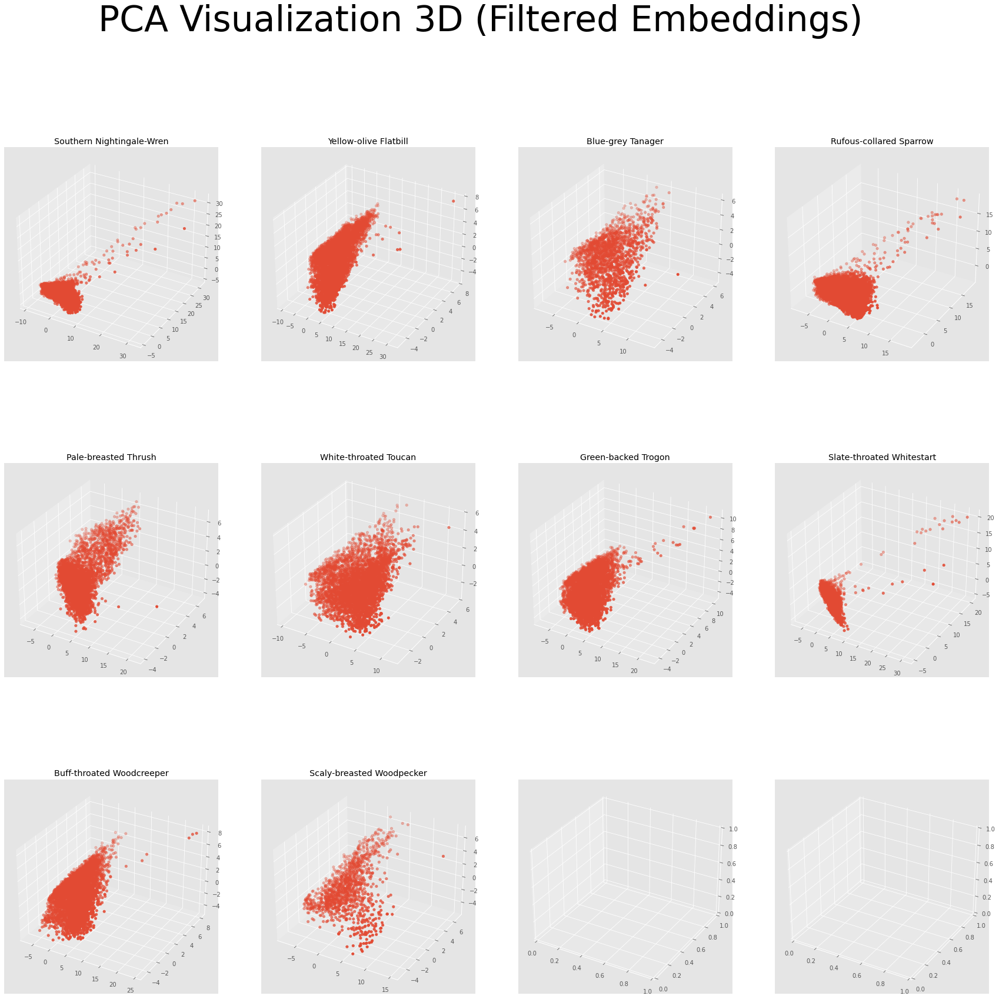

In [25]:
# 3D Visualization for filtered embeddings
figure, axes = plt.subplots(3, 4, figsize = (30, 28), sharex = False, subplot_kw=dict(projection='3d'))

x = 0
y = 0

i = 0
for species in embeddings_df["FILE SPECIES"].unique():
    pca_columns_3d = pd.DataFrame(pca_3d_list[i].transform(filtered_embeddings[filtered_embeddings["FILE SPECIES"] == species][embeddingColumns].dropna())).T
    scatter_plot = axes[x, y].scatter(pca_columns_3d.iloc[0], pca_columns_3d.iloc[1], pca_columns_3d.iloc[1])
    axes[x, y].title.set_text(species)
    if y < 3:
        y += 1
    else:
        y = 0
        x += 1
    i += 1

figure.suptitle("PCA Visualization 3D (Filtered Embeddings)", size=60)